In [1]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import datetime

# Set plot style for consistency
sns.set_context("notebook", font_scale=1.2)

In [2]:
# Load the dataset
try:
    df = pd.read_csv("Prices.csv")
    print("Dataset loaded successfully!")
except FileNotFoundError:
    print("Error: 'Prices.csv' file not found. Please ensure the file is in the correct directory.")
    exit()

# Display basic dataset information
print("Dataset Shape:", df.shape)
print("\nFirst 5 Rows of Dataset:")
print(df.head())

Dataset loaded successfully!
Dataset Shape: (851264, 7)

First 5 Rows of Dataset:
        date symbol        open       close         low        high   volume
0   1/5/2016   WLTW  123.430000  125.839996  122.309998  126.250000  2163600
1   1/6/2016   WLTW  125.239998  119.980003  119.940002  125.540001  2386400
2   1/7/2016   WLTW  116.379997  114.949997  114.930000  119.739998  2489500
3   1/8/2016   WLTW  115.480003  116.620003  113.500000  117.440002  2006300
4  1/11/2016   WLTW  117.010002  114.970001  114.089996  117.330002  1408600


In [3]:
# Convert 'date' column to datetime and numeric columns to float
try:
    df["date"] = pd.to_datetime(df["date"], format="%m/%d/%Y", errors="coerce")
    numeric_cols = ["open", "close", "low", "high", "volume"]
    df[numeric_cols] = df[numeric_cols].astype(float, errors="raise")
except ValueError as e:
    print(f"Error in data type conversion: {e}")
    exit()

In [4]:
df["date"] = pd.to_datetime(df["date"], format="%m/%d/%Y")
df[["open", "close", "low", "high", "volume"]] = df[["open", "close", "low", "high", "volume"]].astype(float)

In [5]:
# Check for invalid dates
if df["date"].isnull().any():
    print("Warning: Some dates could not be parsed and contain NaT values.")

In [6]:
# Display dataset information and summary statistics
print("\nDataset Information:")
print(df.info())
print("\nSummary Statistics:")
print(df.describe())


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 851264 entries, 0 to 851263
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    851264 non-null  datetime64[ns]
 1   symbol  851264 non-null  object        
 2   open    851264 non-null  float64       
 3   close   851264 non-null  float64       
 4   low     851264 non-null  float64       
 5   high    851264 non-null  float64       
 6   volume  851264 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 45.5+ MB
None

Summary Statistics:
                                date           open          close  \
count                         851264  851264.000000  851264.000000   
mean   2013-07-21 02:56:29.294037760      64.993618      65.011913   
min              2010-01-04 00:00:00       1.660000       1.590000   
25%              2011-10-19 00:00:00      31.270000      31.292776   
50%            

In [7]:
# Check for missing values
print("\nMissing Values:")
missing_values = df.isnull().sum()
print(missing_values)
if missing_values.sum() > 0:
    print("Warning: Missing values detected. Consider handling them before proceeding.")


Missing Values:
date      0
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64


In [8]:
# Sort data by date
df = df.sort_values("date")

# Filter data for the last year
last_year_df = df[df["date"] >= df["date"].max() - pd.DateOffset(years=1)]

In [9]:
# Plot closing price for the last year
fig1 = px.line(last_year_df, x="date", y="close", title="Closing Price (Last Year)")
fig1.update_layout(xaxis_title="Date", yaxis_title="Closing Price", template="plotly_white")
fig1.show()

In [10]:
# Plot trading volume for the last year
fig2 = px.line(last_year_df, x="date", y="volume", title="Trading Volume (Last Year)")
fig2.update_layout(xaxis_title="Date", yaxis_title="Volume", template="plotly_white")
fig2.show()

In [11]:
# Resample data to monthly averages and plot
df.set_index("date", inplace=True)
monthly_avg = df.resample('M').mean(numeric_only=True)
fig3 = px.line(monthly_avg, y=["close", "open", "low", "high"], 
               title="Monthly Average Prices (Open, Close, Low, High)")
fig3.update_layout(xaxis_title="Date", yaxis_title="Price", template="plotly_white")
fig3.show()

C:\Users\Ali Hashhash\AppData\Local\Temp\ipykernel_2268\2934522022.py:3: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



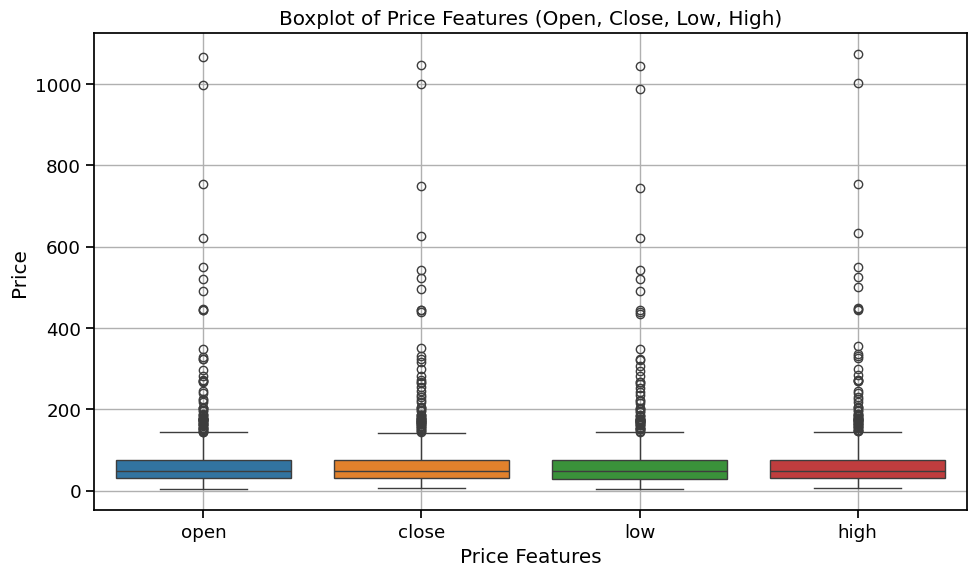

In [12]:
# Boxplot of price features (using a random sample)
sample = df.sample(n=min(1000, len(df)), random_state=42)
plt.figure(figsize=(10, 6))
sns.boxplot(data=sample[["open", "close", "low", "high"]])
plt.title("Boxplot of Price Features (Open, Close, Low, High)")
plt.xlabel("Price Features")
plt.ylabel("Price")
plt.grid(True)
plt.tight_layout()
plt.show()

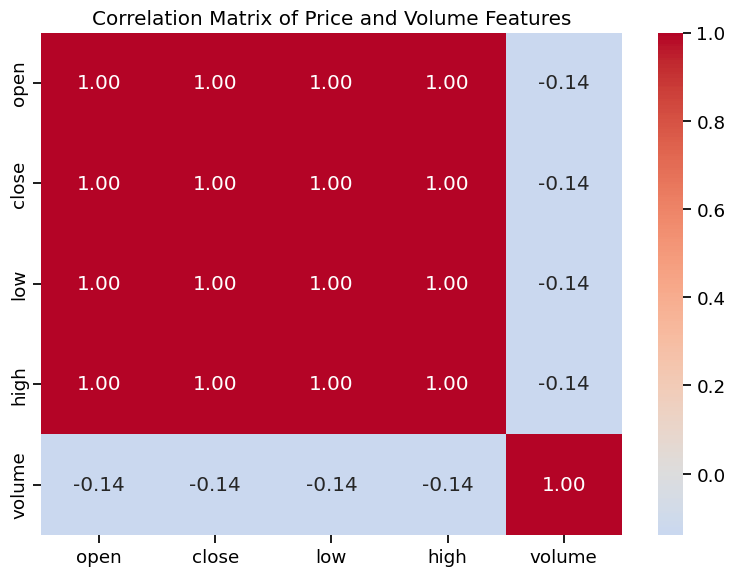

In [13]:
# Correlation matrix heatmap
corr = sample[["open", "close", "low", "high", "volume"]].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Correlation Matrix of Price and Volume Features")
plt.tight_layout()
plt.show()

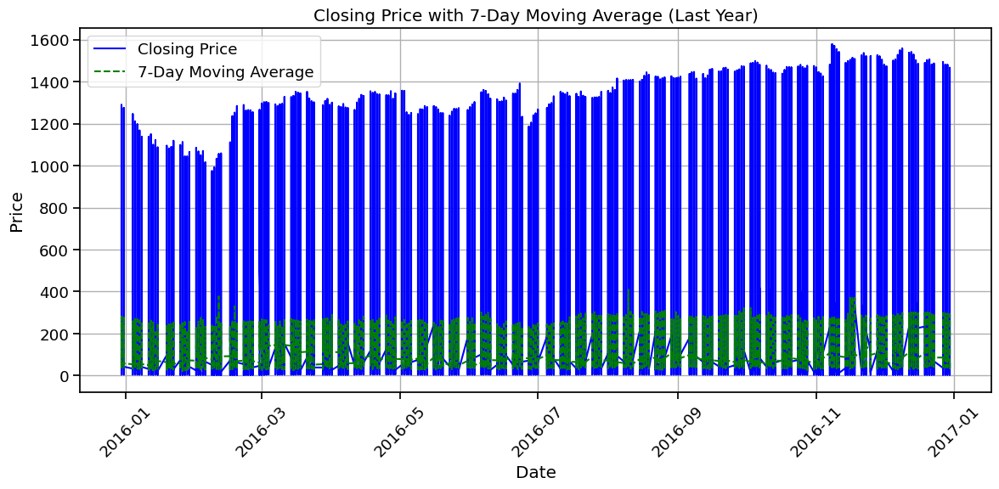

In [14]:
# Calculate 7-day moving average and plot
df["MA7"] = df["close"].rolling(window=7).mean()
ma_year = df[df.index >= df.index.max() - pd.DateOffset(years=1)]
plt.figure(figsize=(12, 6))
plt.plot(ma_year.index, ma_year["close"], label="Closing Price", color="blue")
plt.plot(ma_year.index, ma_year["MA7"], label="7-Day Moving Average", linestyle="--", color="green")
plt.title("Closing Price with 7-Day Moving Average (Last Year)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()